In [2]:
# %pip install wget
# %pip install torch-geometric

In [6]:
import glob
import os
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import IPython.display as ipd
import wget
import seaborn as sns
import zipfile
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import networkx as nx
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import SAGEConv
from torch_geometric.nn import GCNConv
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from torch_geometric.nn import TransformerConv

In [7]:
zip_path = "/home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini.zip"
dir_dataset = "/home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini"

if not os.path.isfile(zip_path):
    print("Please wait a couple of seconds ...")
    wget.download(
        "https://github.com/machinelistening/machinelistening.github.io/blob/master/genres_mini.zip?raw=true",
        out=zip_path,
        bar=None,
    )
    print("genres_mini downloaded successfully ...")
else:
    print("Files already exist!")

with zipfile.ZipFile(zip_path, "r") as f:
    f.extractall(".")
assert os.path.isdir(dir_dataset)
print("All done :)")

files = os.listdir(dir_dataset)
print(files)

Files already exist!
All done :)
['reggae_8.wav', 'hiphop_6.wav', 'rock_6.wav', 'classical_8.wav', 'pop_5.wav', 'classical_7.wav', 'rock_7.wav', 'classical_6.wav', 'jazz_4.wav', 'metal_3.wav', 'reggae_9.wav', 'hiphop_8.wav', 'hiphop_5.wav', 'jazz_2.wav', 'disco_9.wav', 'blues_4.wav', 'blues_10.wav', 'hiphop_10.wav', 'disco_3.wav', 'jazz_8.wav', 'hiphop_4.wav', 'reggae_3.wav', 'country_10.wav', 'country_3.wav', 'rock_9.wav', 'metal_5.wav', 'blues_2.wav', 'pop_2.wav', 'metal_2.wav', 'reggae_2.wav', 'reggae_10.wav', 'jazz_6.wav', 'disco_10.wav', 'pop_8.wav', 'jazz_5.wav', 'classical_1.wav', 'classical_5.wav', 'reggae_4.wav', 'pop_4.wav', 'country_5.wav', 'pop_10.wav', 'rock_10.wav', 'jazz_3.wav', 'rock_1.wav', 'reggae_5.wav', 'blues_8.wav', 'disco_2.wav', 'metal_4.wav', 'country_1.wav', 'classical_10.wav', 'disco_4.wav', 'country_9.wav', 'jazz_10.wav', 'classical_2.wav', 'blues_5.wav', 'hiphop_3.wav', 'metadata.csv', 'pop_9.wav', 'metal_10.wav', 'hiphop_9.wav', 'disco_8.wav', 'classical_9

In [8]:
df = pd.read_csv(
    os.path.join(dir_dataset, "metadata.csv"), names=("fn_wav", "genre", "fn_wav_orig")
)
df.to_csv("songs_genre.csv", index=False)
df.head(20)

,fn_wav,genre,fn_wav_orig
0,blues_1.wav,blues,blues_00072.wav
1,blues_2.wav,blues,blues_00091.wav
2,blues_3.wav,blues,blues_00029.wav
3,blues_4.wav,blues,blues_00054.wav
4,blues_5.wav,blues,blues_00064.wav
5,blues_6.wav,blues,blues_00098.wav
6,blues_7.wav,blues,blues_00082.wav
7,blues_8.wav,blues,blues_00011.wav
8,blues_9.wav,blues,blues_00056.wav
9,blues_10.wav,blues,blues_00028.wav


In [9]:
labels = LabelEncoder().fit_transform(df["genre"])
labels_tensor = torch.tensor(labels, dtype=torch.long)

In [10]:
unique_genres = sorted(list(set(df["genre"])))
n_genres = len(unique_genres)
genre_to_id = {unique_genres[_]: _ for _ in range(n_genres)}
id_to_genre = {_: unique_genres[_] for _ in range(n_genres)}

print(unique_genres)
print(genre_to_id)
print(id_to_genre)

class_ids = [genre_to_id[_] for _ in df["genre"]]
class_ids = np.array(class_ids)
print(class_ids)

random_ids = [3, 45, 23, 67, 77]

for i in random_ids:
    fn_wav = os.path.join(dir_dataset, df["fn_wav"][i])
    genre = df["genre"][i]
    print(f"File: {fn_wav} - Music Genre: {genre}")
    x, fs = librosa.load(fn_wav, sr=44100)
    ipd.display(ipd.Audio(data=x, rate=fs))


def compute_mel_spec_for_audio_file(
    fn_wav, n_fft=1024, hop_length=441, fs=22050.0, n_mels=64
):
    x, fs = librosa.load(fn_wav, sr=fs, mono=True)
    if np.max(np.abs(x)) > 0:
        x = x / np.max(np.abs(x))
    X = librosa.feature.melspectrogram(
        y=x,
        sr=fs,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels,
        fmin=0.0,
        fmax=fs / 2,
        power=1.0,
        htk=True,
        norm=None,
    )
    X = librosa.amplitude_to_db(X)

    return X


all_mel_specs = []
for i, fn_wav in enumerate(files):
    full_path_of_wav = os.path.join(dir_dataset, fn_wav)
    if full_path_of_wav.endswith(".wav"):
        all_mel_specs.append(compute_mel_spec_for_audio_file(full_path_of_wav))

print(
    "We have {} spectrograms of shape {}".format(
        len(all_mel_specs), all_mel_specs[0].shape
    )
)

all_mel_specs = np.array(all_mel_specs)
print(f"Shape of our data tensor : {all_mel_specs.shape}")


def compute_mfcc(fn_wav):
    y, sr = librosa.load(fn_wav)
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
    return np.mean(mfcc, axis=1)


n_files = df.shape[0]
mfcc = np.zeros((n_files, 40))

for n in range(n_files):
    if n % 10 == 0:
        print(f"{n+1}/{n_files}")
    fn_wav = os.path.join(dir_dataset, df["fn_wav"][n])
    mfcc[n, :] = compute_mfcc(fn_wav)

print("Feature extraction finished")

print(mfcc.shape)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
{'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4, 'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}
{0: 'blues', 1: 'classical', 2: 'country', 3: 'disco', 4: 'hiphop', 5: 'jazz', 6: 'metal', 7: 'pop', 8: 'reggae', 9: 'rock'}
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3
 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7
 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 9]
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/blues_4.wav - Music Genre: blues


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/hiphop_6.wav - Music Genre: hiphop


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/country_4.wav - Music Genre: country


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_8.wav - Music Genre: metal


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/pop_8.wav - Music Genre: pop


We have 100 spectrograms of shape (64, 126)
Shape of our data tensor : (100, 64, 126)
1/100
11/100
21/100
31/100
41/100
51/100
61/100
71/100
81/100
91/100
Feature extraction finished
(100, 40)


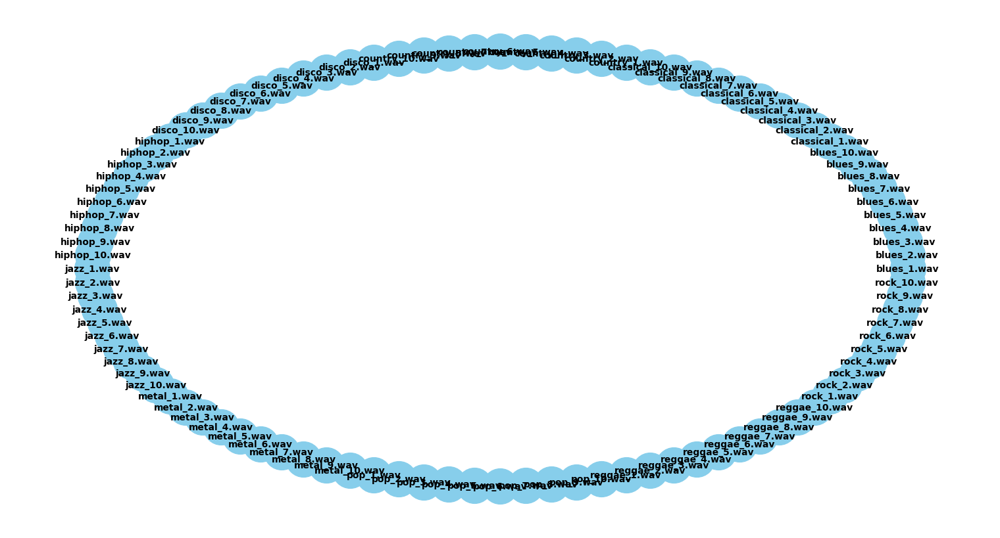

In [11]:
G = nx.Graph()
G.add_nodes_from(df["fn_wav"])
pos = nx.circular_layout(G)

for i, row1 in df.iterrows():
    for j, row2 in df.iterrows():
        if row1["fn_wav"] != row2["fn_wav"] and row1["genre"] == row2["genre"]:
            G.add_edge(row1["fn_wav"], row2["fn_wav"])

plt.figure(figsize=(15, 8))
nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=1500,
    node_color="skyblue",
    font_size=10,
    font_weight="bold",
    edge_color="gray",
)

In [12]:
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader

node_to_index = {node: index for index, node in enumerate(G.nodes)}
edge_index = (
    torch.tensor([[node_to_index[edge[0]], node_to_index[edge[1]]] for edge in G.edges])
    .t()
    .contiguous()
)
data = Data(edge_index=edge_index)
data.x = torch.tensor(mfcc, dtype=torch.float32)
data_loader = DataLoader([data], batch_size=16, shuffle=True)

In [13]:
data_loader

In [12]:
class GraphSAGE(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(in_channels, out_channels)
        self.conv2 = SAGEConv(out_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = F.relu(self.conv2(x, edge_index))
        return x


model = GraphSAGE(in_channels=40, out_channels=40)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    for data in data_loader:
        out = model(data)
        loss = criterion(out, labels_tensor)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

model.eval()
with torch.no_grad():
    sage_embeddings = model(data).detach().numpy()

print(sage_embeddings.shape)

Epoch 1, Loss: 26.295351028442383
Epoch 11, Loss: 1.499015212059021
Epoch 21, Loss: 0.3979279696941376
Epoch 31, Loss: 0.12359320372343063
Epoch 41, Loss: 0.06356103718280792
Epoch 51, Loss: 0.03349291533231735
Epoch 61, Loss: 0.021556727588176727
Epoch 71, Loss: 0.01529800146818161
Epoch 81, Loss: 0.011085109785199165
Epoch 91, Loss: 0.008370098657906055
(100, 40)


In [13]:
class GCN(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, out_channels)
        self.conv2 = GCNConv(out_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x


model = GCN(in_channels=40, out_channels=40)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    for data in data_loader:
        out = model(data)
        loss = criterion(out, labels_tensor)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

model.eval()
with torch.no_grad():
    gcn_embeddings = model(data).detach().numpy()

print(gcn_embeddings.shape)

Epoch 1, Loss: 88.51727294921875
Epoch 11, Loss: 3.590136766433716
Epoch 21, Loss: 0.3452417254447937
Epoch 31, Loss: 0.023104140534996986
Epoch 41, Loss: 0.003607972525060177
Epoch 51, Loss: 0.006302807480096817
Epoch 61, Loss: 0.0008334498852491379
Epoch 71, Loss: 0.00048623551265336573
Epoch 81, Loss: 0.00043549310066737235
Epoch 91, Loss: 0.0003966676886193454
(100, 40)


In [14]:
class GraphTransformer(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(GraphTransformer, self).__init__()
        self.conv1 = TransformerConv(in_channels, out_channels, heads=4, concat=True)
        self.conv2 = TransformerConv(
            out_channels * 4, out_channels, heads=4, concat=False
        )

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x


model = GraphTransformer(in_channels=40, out_channels=40)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    for data in data_loader:
        out = model(data)
        loss = criterion(out, labels_tensor)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.item()}")

model.eval()
with torch.no_grad():
    transformer_embeddings = model(data).detach().numpy()

print(transformer_embeddings.shape)

Epoch 1, Loss: 28.767011642456055
Epoch 11, Loss: 3.0408215522766113
Epoch 21, Loss: 0.5093231797218323
Epoch 31, Loss: 0.09406068176031113
Epoch 41, Loss: 0.008053150027990341
Epoch 51, Loss: 0.002418611664324999
Epoch 61, Loss: 0.0009214832680299878
Epoch 71, Loss: 0.0006118558812886477
Epoch 81, Loss: 0.0004624592256732285
Epoch 91, Loss: 0.00038359742029570043
(100, 40)


In [15]:
from torch.utils.data import DataLoader, TensorDataset

mfcc_scaled = StandardScaler().fit_transform(mfcc)
mfcc_tensor = torch.tensor(mfcc_scaled, dtype=torch.float32)

mfcc_train, mfcc_test, labels_train, labels_test = train_test_split(
    mfcc_tensor, labels_tensor, test_size=0.2, random_state=42
)

print(
    type(mfcc_train),
    mfcc_train.shape,
    type(mfcc_test),
    mfcc_test.shape,
    labels_train.shape,
    labels_test.shape,
)

train_dataset = TensorDataset(mfcc_train, labels_train)
test_dataset = TensorDataset(mfcc_test, labels_test)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16)

<class 'torch.Tensor'> torch.Size([80, 40]) <class 'torch.Tensor'> torch.Size([20, 40]) torch.Size([80]) torch.Size([20])


In [16]:
class SimpleMLP(nn.Module):
    def __init__(self, n_in, n_classes=10):
        super(SimpleMLP, self).__init__()
        self.fc1 = nn.Linear(n_in, 128)
        self.fc2 = nn.Linear(128, 32)
        self.fc3 = nn.Linear(32, n_classes)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.softmax(self.fc3(x), dim=1)
        return x

In [17]:
model = SimpleMLP(n_in=mfcc_tensor.shape[1], n_classes=10)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 200
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for mfcc_batch, labels_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(mfcc_batch)
        loss = criterion(outputs, labels_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")


model.eval()
correct = 0
total = 0
with torch.no_grad():
    for mfcc_batch, labels_batch in test_loader:
        outputs = model(mfcc_batch)
        _, predicted = torch.max(outputs, 1)
        total += labels_batch.size(0)
        correct += (predicted == labels_batch).sum().item()

print(f"Accuracy: {100 * correct / total}%")

random_id = 66
fn_wav = os.path.join(dir_dataset, df["fn_wav"][random_id])
genre = df["genre"][random_id]
print(f"File: {fn_wav} - Music Genre: {genre}")
x, fs = librosa.load(fn_wav, sr=44100)
ipd.display(ipd.Audio(data=x, rate=fs))

dist_mfcc = np.sqrt(np.sum((mfcc - mfcc[random_id]) ** 2, axis=1))
idx = np.argsort(dist_mfcc)

x, fs = librosa.load(fn_wav, sr=44100)
ipd.display(ipd.Audio(data=x, rate=fs))

for i in range(7):

    curr_idx = idx[i + 1]
    fn_wav = os.path.join(dir_dataset, df["fn_wav"][curr_idx])
    genre = df["genre"][curr_idx]
    print(f"File: {fn_wav} - Music Genre: {genre} - Distance {dist_mfcc[idx[i+1]]}")
    x, fs = librosa.load(fn_wav, sr=44100)
    ipd.display(ipd.Audio(data=x, rate=fs))

Epoch 1, Loss: 2.3030027389526366
Epoch 11, Loss: 2.2413985252380373
Epoch 21, Loss: 2.084788751602173
Epoch 31, Loss: 1.934615683555603
Epoch 41, Loss: 1.8952428102493286
Epoch 51, Loss: 1.7596739292144776
Epoch 61, Loss: 1.7307649374008178
Epoch 71, Loss: 1.6533294677734376
Epoch 81, Loss: 1.6426455974578857
Epoch 91, Loss: 1.6143476486206054
Epoch 101, Loss: 1.5696177721023559
Epoch 111, Loss: 1.5568495512008667
Epoch 121, Loss: 1.5728671073913574
Epoch 131, Loss: 1.5721313953399658
Epoch 141, Loss: 1.5353222846984864
Epoch 151, Loss: 1.5387141942977904
Epoch 161, Loss: 1.5490521430969237
Epoch 171, Loss: 1.5233256101608277
Epoch 181, Loss: 1.5174279928207397
Epoch 191, Loss: 1.5135220050811768
Accuracy: 30.0%
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_7.wav - Music Genre: metal


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_3.wav - Music Genre: metal - Distance 33.45442132838181


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_2.wav - Music Genre: metal - Distance 38.353199035500126


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/country_9.wav - Music Genre: country - Distance 39.02972380512152


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/blues_7.wav - Music Genre: blues - Distance 42.78413758272108


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_9.wav - Music Genre: metal - Distance 46.21727904601288


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_1.wav - Music Genre: metal - Distance 49.56567982858504


File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/country_2.wav - Music Genre: country - Distance 51.25672280038854


In [31]:
all_graph_embeddings = {
    "sage_embeddings": sage_embeddings,
    "gcn_embeddings": gcn_embeddings,
    "transformer_embeddings": transformer_embeddings,
}

In [33]:
def calculate_cosine_similarity(embeddings, random_id):
    embeddings = np.array(embeddings)
    reference_embedding = embeddings[random_id]
    dot_product = np.dot(embeddings, reference_embedding)
    norms = np.linalg.norm(embeddings, axis=1)
    reference_norm = np.linalg.norm(reference_embedding)
    cosine_similarity = dot_product / (norms * reference_norm)
    return cosine_similarity


def calculate_euclidean_distance(embeddings, random_id):
    embeddings = np.array(embeddings)
    distances = np.sqrt(np.sum((embeddings - embeddings[random_id]) ** 2, axis=1))
    return distances


def calculate_manhattan_distance(embeddings, random_id):
    reference_embedding = embeddings[random_id]
    manhattan_distance = np.sum(np.abs(embeddings - reference_embedding), axis=1)
    return manhattan_distance


def calculate_chebyshev_distance(embeddings, random_id):
    reference_embedding = embeddings[random_id]
    chebyshev_distance = np.max(np.abs(embeddings - reference_embedding), axis=1)
    return chebyshev_distance


def calculate_minkowski_distance(embeddings, random_id, p):
    reference_embedding = embeddings[random_id]
    minkowski_distance = np.sum(
        np.abs(embeddings - reference_embedding) ** p, axis=1
    ) ** (1 / p)
    return minkowski_distance


def calculate_hamming_distance(embeddings, random_id):
    reference_embedding = embeddings[random_id]
    hamming_distance = np.sum(embeddings != reference_embedding, axis=1)
    return hamming_distance


def calculate_jaccard_distance(embeddings, random_id):
    reference_embedding = embeddings[random_id]
    intersection = np.sum(np.minimum(embeddings, reference_embedding), axis=1)
    union = np.sum(np.maximum(embeddings, reference_embedding), axis=1)
    jaccard_distance = np.abs(1 - intersection / union)
    return jaccard_distance

In [39]:
for name, embeddings in all_graph_embeddings.items():
    print(
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
    )
    print(name)
    print(
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
        """"""
    )
    emb_scaled = StandardScaler().fit_transform(embeddings)
    emb_tensor = torch.tensor(emb_scaled, dtype=torch.float32)

    emb_train, emb_test, labels_train, labels_test = train_test_split(
        emb_tensor, labels_tensor, test_size=0.2, random_state=42
    )

    print(
        type(emb_train),
        emb_train.shape,
        type(emb_test),
        emb_test.shape,
        labels_train.shape,
        labels_test.shape,
    )

    train_dataset = TensorDataset(emb_train, labels_train)
    test_dataset = TensorDataset(emb_test, labels_test)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=16)

    model = SimpleMLP(n_in=emb_tensor.shape[1], n_classes=10)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    num_epochs = 200
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for emb_batch, labels_batch in train_loader:
            optimizer.zero_grad()
            outputs = model(emb_batch)
            loss = criterion(outputs, labels_batch)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        if epoch % 10 == 0:
            print(f"Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}")

    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for emb_batch, labels_batch in test_loader:
            outputs = model(emb_batch)
            _, predicted = torch.max(outputs, 1)
            total += labels_batch.size(0)
            correct += (predicted == labels_batch).sum().item()

    print(f"Accuracy: {100 * correct / total}%")

    random_id = 66
    fn_wav = os.path.join(dir_dataset, df["fn_wav"][random_id])
    genre = df["genre"][random_id]
    print(f"File: {fn_wav} - Music Genre: {genre}")
    x, fs = librosa.load(fn_wav, sr=44100)
    ipd.display(ipd.Audio(data=x, rate=fs))

    dist_emb = calculate_euclidean_distance(embeddings, random_id)
    dist_idx = np.argsort(dist_emb)
    print(dist_idx)
    x, fs = librosa.load(fn_wav, sr=44100)
    ipd.display(ipd.Audio(data=x, rate=fs))
    for i in range(7):
        curr_idx = dist_idx[i + 1]
        print(curr_idx)
        fn_wav = os.path.join(dir_dataset, df["fn_wav"][curr_idx])
        genre = df["genre"][curr_idx]
        print(
            f"File: {fn_wav} - Music Genre: {genre} - Distance {dist_emb[dist_idx[i+1]]}"
        )
        x, fs = librosa.load(fn_wav, sr=44100)
        ipd.display(ipd.Audio(data=x, rate=fs))

    # cosine_simi_emb = calculate_cosine_similarity(embeddings, random_id)
    # cosine_idx = np.argsort(cosine_simi_emb)
    # x, fs = librosa.load(fn_wav, sr=44100)
    # ipd.display(ipd.Audio(data=x, rate=fs))
    # for i in range(7):
    #     curr_idx = cosine_idx[i+1]
    #     fn_wav = os.path.join(dir_dataset, df["fn_wav"][curr_idx])
    #     genre = df["genre"][curr_idx]
    #     print(f"File: {fn_wav} - Music Genre: {genre} - Distance {dist_emb[cosine_idx[i+1]]}")
    #     x, fs = librosa.load(fn_wav, sr=44100)
    #     ipd.display(ipd.Audio(data=x, rate=fs))


sage_embeddings

<class 'torch.Tensor'> torch.Size([80, 40]) <class 'torch.Tensor'> torch.Size([20, 40]) torch.Size([80]) torch.Size([20])
Epoch 1, Loss: 2.299901247024536
Epoch 11, Loss: 2.1582526206970214
Epoch 21, Loss: 1.893665623664856
Epoch 31, Loss: 1.7561680555343628
Epoch 41, Loss: 1.6477348804473877
Epoch 51, Loss: 1.6127869129180907
Epoch 61, Loss: 1.596422290802002
Epoch 71, Loss: 1.5428422927856444
Epoch 81, Loss: 1.5362836837768554
Epoch 91, Loss: 1.5264559745788575
Epoch 101, Loss: 1.5274341821670532
Epoch 111, Loss: 1.5142140150070191
Epoch 121, Loss: 1.4952447414398193
Epoch 131, Loss: 1.5115144729614258
Epoch 141, Loss: 1.4794986724853516
Epoch 151, Loss: 1.4894773483276367
Epoch 161, Loss: 1.4845590829849242
Epoch 171, Loss: 1.480706548690796
Epoch 181, Loss: 1.4975040197372436
Epoch 191, Loss: 1.4736496448516845
Accuracy: 90.0%
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_7.wav - Music Genre: metal


[66 68 62 69 67 65 63 61 64 38 33 35 37 98 39 32 96 36 31 34 51 99 97 95
 55 42 43 92 41 93 53 60 94 52 54 25 28 50 30 56 91 45 90 44 57 40 59  8
 27  6 58 46 49 47 26 48 20 29  5 85 24 81 80 82  0 86 83  9 87 84 23 70
  7  4 10 78 88 71 89 74 22 73 21  3  1 76 77 79 72 75  2 19 16 17 18 15
 12 13 14 11]


68
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_9.wav - Music Genre: metal - Distance 3.7253170013427734


62
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_3.wav - Music Genre: metal - Distance 3.886997699737549


69
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_10.wav - Music Genre: metal - Distance 6.313206195831299


67
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_8.wav - Music Genre: metal - Distance 7.273979663848877


65
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_6.wav - Music Genre: metal - Distance 7.39015007019043


63
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_4.wav - Music Genre: metal - Distance 7.715482711791992


61
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_2.wav - Music Genre: metal - Distance 10.574374198913574



gcn_embeddings

<class 'torch.Tensor'> torch.Size([80, 40]) <class 'torch.Tensor'> torch.Size([20, 40]) torch.Size([80]) torch.Size([20])
Epoch 1, Loss: 2.296740198135376
Epoch 11, Loss: 2.0263683795928955
Epoch 21, Loss: 1.7785108089447021
Epoch 31, Loss: 1.589638090133667
Epoch 41, Loss: 1.5587253808975219
Epoch 51, Loss: 1.5442689657211304
Epoch 61, Loss: 1.5002320289611817
Epoch 71, Loss: 1.4821748733520508
Epoch 81, Loss: 1.4761922121047975
Epoch 91, Loss: 1.4710471391677857
Epoch 101, Loss: 1.4750637531280517
Epoch 111, Loss: 1.472222661972046
Epoch 121, Loss: 1.4755286693572998
Epoch 131, Loss: 1.4656667709350586
Epoch 141, Loss: 1.4709991931915283
Epoch 151, Loss: 1.4748098850250244
Epoch 161, Loss: 1.4655545949935913
Epoch 171, Loss: 1.4634730100631714
Epoch 181, Loss: 1.4644948959350585
Epoch 191, Loss: 1.4626636028289794
Accuracy: 100.0%
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_7.wav - Music Genre: metal


[66 65 67 68 64 69 63 62 61 60 31 30 32 33 34 35 36 37  0 40 38 90 39 80
 41 70 91 71 50 42 72  1 81 73 51 92 74 43 75 52 76 77 78 53 44 79 82 93
 45 54 55 46 56 47 94 83 57 48  2 95 49 58 96 84 59 97 98 99 85  3 86  4
 87  5  6 88 20  7 89  8  9 21 22 23 10 24 25 26 27 28 29 11 12 13 14 15
 16 17 18 19]


65
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_6.wav - Music Genre: metal - Distance 4.853117942810059


67
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_8.wav - Music Genre: metal - Distance 5.034030437469482


68
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_9.wav - Music Genre: metal - Distance 8.77656078338623


64
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_5.wav - Music Genre: metal - Distance 11.405200004577637


69
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_10.wav - Music Genre: metal - Distance 12.324259757995605


63
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_4.wav - Music Genre: metal - Distance 18.861597061157227


62
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_3.wav - Music Genre: metal - Distance 26.68238067626953



transformer_embeddings

<class 'torch.Tensor'> torch.Size([80, 40]) <class 'torch.Tensor'> torch.Size([20, 40]) torch.Size([80]) torch.Size([20])
Epoch 1, Loss: 2.297559928894043
Epoch 11, Loss: 2.1762694358825683
Epoch 21, Loss: 1.9524977445602416
Epoch 31, Loss: 1.7909285068511962
Epoch 41, Loss: 1.6896790266036987
Epoch 51, Loss: 1.609718132019043
Epoch 61, Loss: 1.5979474544525147
Epoch 71, Loss: 1.5421815395355225
Epoch 81, Loss: 1.5508962154388428
Epoch 91, Loss: 1.507095742225647
Epoch 101, Loss: 1.5079113006591798
Epoch 111, Loss: 1.5231218338012695
Epoch 121, Loss: 1.5331904649734498
Epoch 131, Loss: 1.514371109008789
Epoch 141, Loss: 1.5216450452804566
Epoch 151, Loss: 1.4950583696365356
Epoch 161, Loss: 1.4986005544662475
Epoch 171, Loss: 1.5088243007659912
Epoch 181, Loss: 1.4879040241241455
Epoch 191, Loss: 1.4975695848464965
Accuracy: 70.0%
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_7.wav - Music Genre: metal


[66 68 63 62 69 61 65 67 64 98 96 95 31 38 33 42 43 34  4 36 35 32 41  5
 97 46 99 94 39 44 49 45 93 37  6 92 48 53 91  8 55 51 47 76 74 78 77 54
 86 79 56 73 89 72 81 52 87 75 88  3 85 90  1 82 71 20 83 84 59 70  0 57
 58  2  7 50 27 28 25 30 24  9 60 26 22 80 40 29 23 10 21 14 16 15 12 18
 19 11 13 17]


68
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_9.wav - Music Genre: metal - Distance 11.603469848632812


63
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_4.wav - Music Genre: metal - Distance 12.775489807128906


62
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_3.wav - Music Genre: metal - Distance 15.538559913635254


69
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_10.wav - Music Genre: metal - Distance 15.86327075958252


61
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_2.wav - Music Genre: metal - Distance 17.541976928710938


65
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_6.wav - Music Genre: metal - Distance 20.32316780090332


67
File: /home/ics/Documents/Education/Media_engg/Sem_1/CASM/Project/genres_mini/metal_8.wav - Music Genre: metal - Distance 21.89284896850586
